# Projekt Bild- und Signalverarbeitung - Kamerakalibrierung und Vermessung von Paketen

Im Kontext des Moduls Bild- und Signalverarbeitung folgt die Studienarbeit von Adrian Schiel (7022935) und Mirko Labitzke (7021691). Betreut wird diese Arbeit von Prof. Koch. <br>
Die Aufgabenstellung ist dabei, selber eine Kamera in Form einer Webcam oder Ähnlichem zu kalibrieren und mithilfe der Kalibrierung Pakete zu vermessen.

### Zielsetzung

Im Rahmen der Studienarbeit ist das Ziel, eine Webcam, in unserem Fall eine "Logitech c925e" 1080p ohne Auto-Fokus, zu kalibrieren. Dazu werden innerhalb einer Fotobox verschiedene Bilder von Schachbrettmustern gemacht und anschließend diese mithilfe von Algorithmen aus der OpenCV Bibliothek genutzt, um den Fehler und andere Werte der Kamera zu ermitteln. Die Fotobox wird verwendet, um besonders gute Bilder mit kontrollierten Lichtverhältnissen und wenig Einfluss von außen machen zu können. <br>
Mithilfe der Kamerakalibrierung sollen verschieden große und farbige Pakete erkannt und vermessen werden. Die Bilder der Pakete werden ebenfalls unter genau den gleichen Bedingungen gemacht. Bei der Vermessung der Pakete wird sich erst auf die 2D Vermessung von Höhe und Breite konzentriert. Die 3D Vermessung von Höhe, Breite und Tiefe wäre der Schritt, der darauf folgt, wenn die 2D Vermessung gut klappt.  <br>
Die Zielsetzung allgemein ist bei dem Projekt einfach zu definieren:
#### Es soll eine möglichst gute Kamerakalibrierung gefunden werden, mit welcher die unterschiedlichen Pakete möglichst genau vermessen werden können!

## Importieren der nötigen Pakete und Bibliotheken

Mit simplen import Befehlen werden am Anfang alle benötigten Pakete und Bibliotheken importiert. <br>
Dabei ist es wichtig, dass das Paket opencv-python erfolgreich auf dem Computer installiert ist. Bei Problemen ist eine Neuinstallation mit pip vielleicht notwendig. <br>
- pip uninstall opencv-python | pip install opencv-python


### Pakete und ihre Versionen
- matplotlib==3.8.2
- matplotlib-inline==0.1.6
- numpy==1.26.3
- opencv-python==4.9.0.80
- scikit-image==0.22.0

In [1]:
import cv2 as cv
import numpy as np
import glob
import matplotlib.pyplot as plt
from skimage import measure, color, filters
import os

## Bilder erstellen, einlesen und anzeigen

### Kameraeinstellungen anpassen und Bilder machen - getImages()

In der Methode getImages() werden die nötigen Einstellungen für die Kamera vorgenommen. Dabei wird die Breite des Bildes auf 1920 Pixel und die Höhe auf 1080 Pixel eingestellt. Außerdem wird der Auto-Fokus und die Auto-Belichtung ausgeschaltet, damit diese keinen Einfluss auf die Bilder haben und eine Kalibrierung "per Hand" notwendig wird. <br>

Nachdem die Einstellungen vorgenommen werden, ist das Kamerabild in einem externen Fenster zu sehen und mithilfe von drücken der 'S' Taste werden Bilder zur Kalibrierung gespeicherT. Allgemein gilt, je mehr gute Bilder zur Kalibrierung zur Verfügung stehen, desto besser wird diese. Nach drücken der 'ESC' Taste wird das externe Fenster geschlossen und die Kamera kann mithilfe der abgespeicherten Bilder kalibriert werden.

In [2]:
def getImages(pathname, autoExposure=True,displayImages=False):
    
    if not os.path.exists(pathname):
        os.makedirs(pathname)
        print(f"Der Ordner {pathname} wurde erstellt.")
    
    width = 1920
    height = 1080

    cap = cv.VideoCapture(0)

    cap.set(cv.CAP_PROP_FRAME_WIDTH, width)
    cap.set(cv.CAP_PROP_FRAME_HEIGHT, height)
    cap.set(cv.CAP_PROP_AUTOFOCUS,0)
    cap.set(cv.CAP_PROP_AUTO_EXPOSURE, 1)
    if not autoExposure:
        cap.set(cv.CAP_PROP_AUTO_EXPOSURE, 0)
        cap.set(cv.CAP_PROP_EXPOSURE, -4) #https://www.principiaprogramatica.com/2017/06/11/setting-manual-exposure-in-opencv/

    num = 0

    while cap.isOpened():
        success, img = cap.read()

        k = cv.waitKey(5)
        savepath = f'{pathname}/img{str(num)}.png'

        if k == 27:  # ESC Button
            break
        elif k == ord('s'):
            cv.imwrite(savepath, img)
            print(f"{savepath} saved!")
            num += 1
            if(displayImages):
                plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
                plt.title(f"Bild {num}")
                plt.axis('off')
                plt.show()


        cv.imshow("Live-Video-Feed", img)

    cap.release()


Hier wird die Methode getImages() aufgerufen, um sich neue Bilder für die Kalibrierung zu erstellen. Die Methode ist auskommentiert, da die Bilder theoretisch nur einmal erstellt werden müssen, um damit zu arbeiten. Falls neue Bilder benötigt werden, kann diese Zeile jeder Zeit wieder in Betrieb genommen werden.

In [3]:
getImages('./test/')

### Kalibrierungs-Bilder aus dem Ordner anzeigen - showImagesFromFolder()

In der Methode showImagesFromFolder() werden Bilder aus einem übergebenen Ordner ausgegeben. Dabei wird ebenfalls geprüft, ob der Ordner leer ist und, falls dies der Fall ist, eine Fehler-Meldung ausgegeben.

In [4]:
def showImagesFromFolder(pathname):
    # Überprüfen, ob der Ordner existiert
    if not os.path.exists(pathname):
        print(f"Der Ordner {pathname} existiert nicht.")
        return

    # Liste der Bildpfade im Ordner erhalten
    images = glob.glob(f'{pathname}/*.png')

    if not images:
        print("Es wurden keine Bilder im angegebenen Ordner gefunden.")
        return

    # Bilder nebeneinander anzeigen
    num_images = len(images)
    num_rows = (num_images + 2) // 3
    num_cols = min(num_images, 3)

    plt.figure(figsize=(16, 3 * num_rows))
    for i, img_path in enumerate(images, start=1):
        img = cv.imread(img_path)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        plt.subplot(num_rows, num_cols, i)
        plt.imshow(img_rgb)
        plt.title(img_path)
        plt.axis('off')
    plt.tight_layout()

    plt.show()


Aufrufen der Methode showImagesFromFolder(), um die vorher erstellten Bilder zur Kalibrierung anzeigen zu lassen.

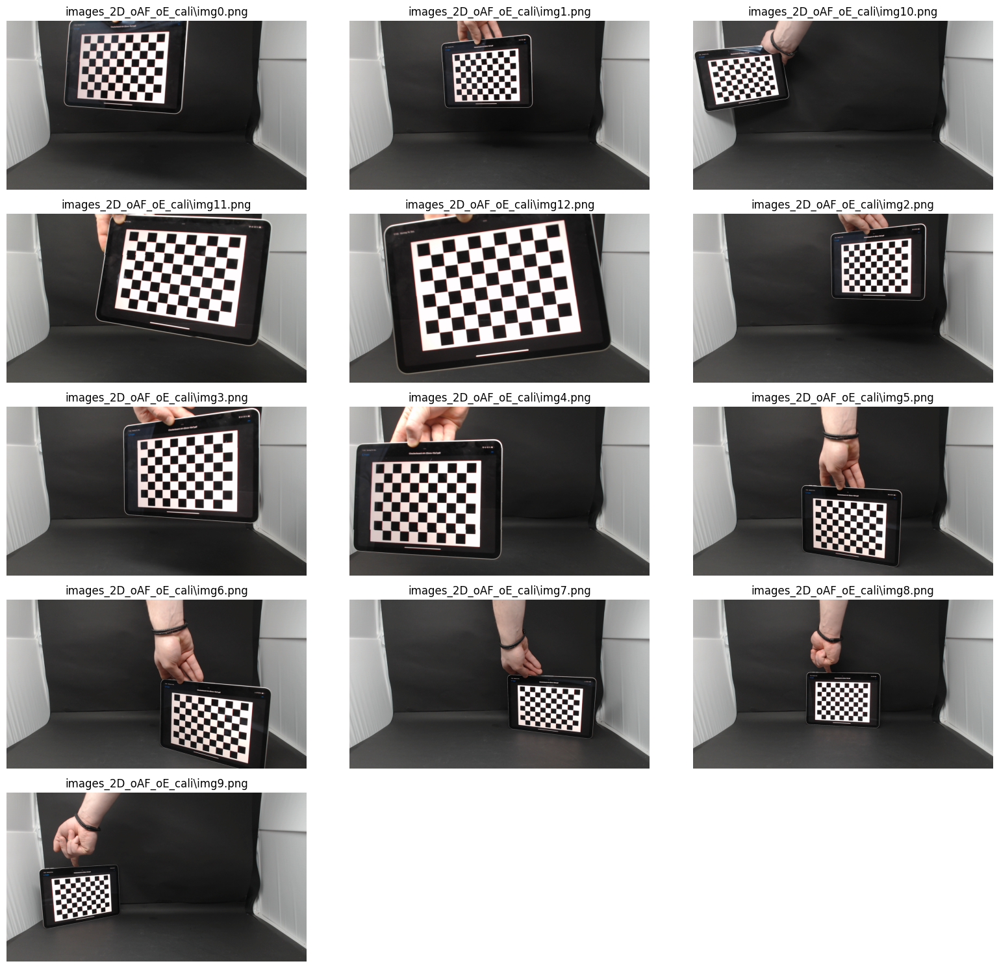

In [5]:
showImagesFromFolder("images_2D_oAF_oE_cali")

Aufrufen der Methode showImagesFromFolder(), um die Bilder der verschiedenen Pakete, welche vermessen werden sollen, anzuzeigen.

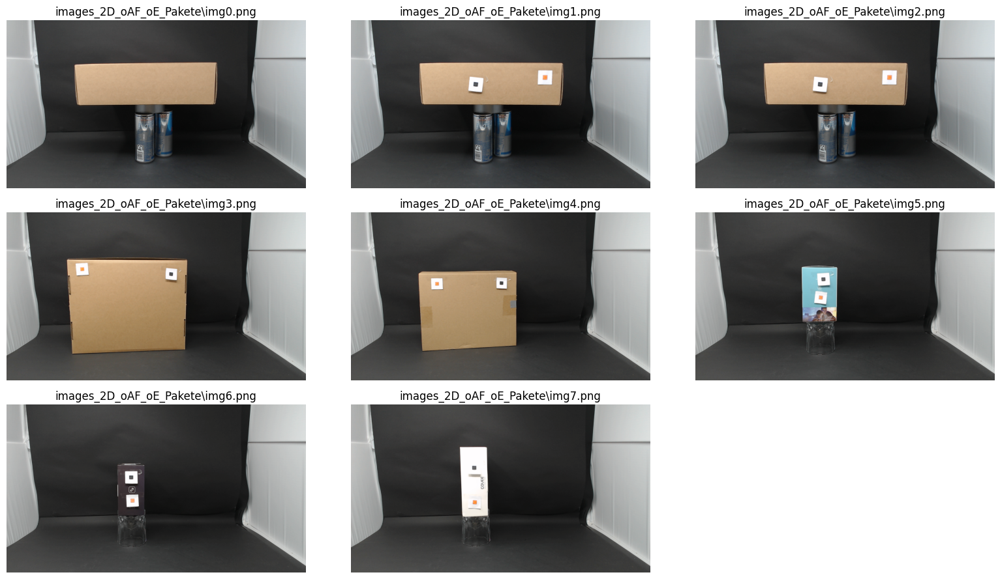

In [6]:
showImagesFromFolder('images_2D_oAF_oE_Pakete')

## Kamera Kallibrieren

Im Folgenden wird schrittweise die Kamera kalibriert. 



### 1. Das Schachfeld suchen

Als ersten Schritt werden auf dem jeweiligen Bild zur Kalibrierung ein 10x7 großes Schachfeld gesucht, in diesem wird jede Ecke gesucht und mitsamt seiner Koordinaten zurückgegeben.

In [7]:
def findChessboardCorners(img, chessboard_size):
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    ret, corners = cv.findChessboardCorners(gray, chessboard_size, None)
    return ret, corners

### 2. Verfeinerungen der Schachbrettecken

Die Funktion refineCorners() verfeinert die ursprünglichen Ecken eines Bildes auf Subpixel-Ebene, wodurch eine genauere Positionierung der Ecken erreicht wird.

In [8]:
def refineCorners(img, corners, criteria):
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    corners_refined = cv.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
    return corners_refined

### 3. Vorbereitung der 3D-Koordinaten der Eckpunkte

Die Funktion prepareObjectPoints() bereitet die 3D-Koordinaten der Eckpunkte des Schachbretts vor. Diese vorbereiteten Objektpunkte werden verwendet, um die intrinsischen und extrinsischen Parameter der Kamera zu ermitteln.

In [9]:
def prepareObjectPoints(chessboard_size=(10,7)):
    objp = np.zeros((chessboard_size[0] * chessboard_size[1], 3), np.float32)
    objp[:,:2] = np.mgrid[0:chessboard_size[0],0:chessboard_size[1]].T.reshape(-1,2)

    size_of_chessboard_squares_mm = 20
    objp = objp * size_of_chessboard_squares_mm
    return objp

### 4. Durchiterieren und Aufrufen der Methoden

In der Methode collectObjectAndImagePoints() wird durch einen Ordner mit Bildern iteriert. Dabei werden bei jedem einzelnen Bild die Methoden aus Schritt 1 und 2 aufgerufen, dabei werden die Punkte auf dem Schachfeld ermittelt und übergeben. 

In [10]:

def collectObjectAndImagePoints(pathname, chessboard_size, objp, draw=True):
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    objpoints = []
    imgpoints = [] 
    
    
    images = glob.glob(f'{pathname}/*.png')
    
    num_images = len(images)
    num_rows = (num_images + 2) // 3
    num_cols = min(num_images, 3)

    if draw:
        fig, axes = plt.subplots(num_rows, num_cols,figsize=(16, 3 * num_rows), constrained_layout=True)
    
    
    for i, image in enumerate(images):
        img = cv.imread(image)
        ret, corners = findChessboardCorners(img, chessboard_size)

        if ret:
            corners_refined = refineCorners(img, corners, criteria)
            objpoints.append(objp)
            imgpoints.append(corners_refined)
            if draw:
                cv.drawChessboardCorners(img, chessboard_size, corners_refined, ret)
                axes[i // num_cols, i % num_cols].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
                axes[i // num_cols, i % num_cols].set_title(image)
                axes[i // num_cols, i % num_cols].axis('off')
    if draw:    
        for i in range(num_images, num_rows * num_cols):
            row_idx = i // num_cols
            col_idx = i % num_cols
            axes[row_idx, col_idx].axis('off')
        plt.tight_layout()
        plt.show()
    
    
    return objpoints, imgpoints
    


### 5. Kalibrieren der Kamera und Berechnung der Verzerrungskorrektur

Die Methode calibrate() ermittelt mittels der vorher geschriebenen Methoden sowohl neue CameraMatrixs, mithilfe der verschiedenen Bildern mit Schachbrättern, als auch den Fehler, der durch die Kamera erzeugt wird. Der Fehler der Kamera wird anschließend ausgegeben und die Methode ermittelt die notwendige Verzerrungskorrektur, welche am Ende übergeben wird.

In [11]:
def calibrate(pathname, image_path, chessboard_size=(10,7),frame_size=(1920,1080), draw=True, print_error=True):
    objp = prepareObjectPoints(chessboard_size)

    objpoints, imgpoints = collectObjectAndImagePoints(pathname, chessboard_size, objp, draw=draw)
    
    ret, camera_matrix, dist_coeff, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, frame_size, None, None)
    
    img = cv.imread(image_path)
    h,  w = img.shape[:2]
    newCameraMatrix, roi = cv.getOptimalNewCameraMatrix(camera_matrix, dist_coeff, (w,h), 1, (w,h))

    # Undistort -  Verzerrungskorrektur
    dst = cv.undistort(img, camera_matrix, dist_coeff, None, newCameraMatrix)

    x, y, w, h = roi
    dst = dst[y:y+h, x:x+w]
    
    if print_error:
        mean_error = 0

        for i in range(len(objpoints)):
            imgpoints2, _ = cv.projectPoints(objpoints[i], rvecs[i], tvecs[i], camera_matrix, dist_coeff)
            error = cv.norm(imgpoints[i], imgpoints2, cv.NORM_L2)/len(imgpoints2)
            mean_error += error

        print("total error: {}".format(mean_error/len(objpoints))) 
    
    return dst   



Aufruf der Methode calibrate() und dadurch Anpassungen und Ausgabe von Bild-7.

total error: 0.041934246314467086
(1062, 1909, 3)


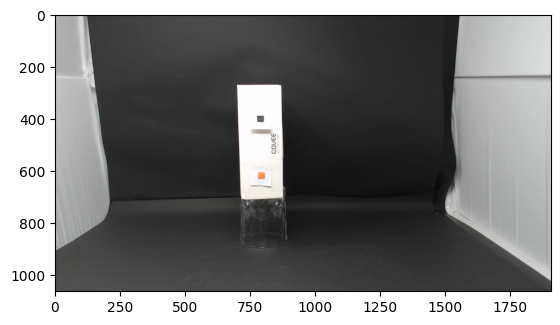

In [12]:
calibrated_img = calibrate(pathname='images_2D_oAF_oE_cali', image_path='images_2D_oAF_oE_Pakete/img7.png', draw=False)

print(calibrated_img.shape)
plt.imshow(cv.cvtColor(calibrated_img, cv.COLOR_BGR2RGB))
plt.show()

## Finden und Ausmessen des Paketes auf dem Bild

Der nächste Schritt ist, das Paket auf dem Bild zu finden und die Maße in Pixeln zu ermitteln.

### 1. Vorbereitung des Bildes

Die Methode prepareImage() bereitet das Bild auf weitere Algorithmen vor, indem links und rechts jeweils der weiße Teil der Fotobox enfernt wird. Anschließend wird neben dem originalem Bild ebenfalls das Bild nur mit Grauwerten übergeben.

In [13]:
def prepareImage(image, margin_right:int, margin_left:int, draw=True):
    image = image[:, margin_left:margin_right]

    gray_image = color.rgb2gray(image)

    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    if draw:
        plt.imshow(image)
        plt.show()
        plt.imshow(gray_image, cmap='gray')
        plt.show()

    return gray_image, image

### 2. Anwenden des Otsu-Filters

In getBinaryImage2D() wird ein Bild übergeben, auf dieses Bild wird der Otsu_Filter angewandt. Dieser Filter teilt das Bild in genau 2 Ebenen, Hintergrund(0) und Vordergrund(1).

In [14]:
def getBinaryImage2D(image, draw=True):
    thresh = filters.threshold_otsu(image)
    binary_image = image > thresh

    if draw:
        plt.imshow(binary_image, cmap='gray')
        plt.show()
    return binary_image

### 3. Finden der größten Region   
In der Methode getLargestRegion2D() wird innerhalb des binären Bildes nach Regionen gesucht, diese werden gelabelt und die größte Region wird als Rückgabewert zurückgegeben. Dadurch, dass die Bilder von relativ hoher Qualität sind, kann davon ausgegangen werden, dass die größte Region auf den Bildern immer das gesuchte Paket ist.

In [15]:
def getLargestRegion2D(binary_image):
    labeled_image = measure.label(binary_image)

    regions = measure.regionprops(labeled_image)
    
    print(f'Found {len(regions)} Regions')

    largest_region = max(regions, key=lambda region: region.area)
    
    return largest_region

### 3. Kantenlängen in Pixeln ermitteln
In getEdgeLenght2D() werden die Methoden aus 2. und 3. aufgerufen, dadurch erhält man passend die größte Region auf dem Bild, welche das Paket darstellt. Um die Region wird ein Begrenzungsrechteck gezeichnet und das Originalbild wird mitsamt des Rechteckes ausgegeben. Die Methode gibt am Ende die Breite und die Höhe in Pixeln zurück.

In [16]:
def getEdgeLenght2D(prepared_image, draw_Binary=True, draw_Final=True):
    binary_image = getBinaryImage2D(prepared_image, draw=draw_Binary)

    largest_region = getLargestRegion2D(binary_image)

    minr, minc, maxr, maxc = largest_region.bbox

    width = maxc - minc
    height = maxr - minr
    
    print(f'Kantenlänge (Breite): {width} Pixel')
    print(f'Kantenlänge (Höhe): {height} Pixel')
    
    if draw_Final:
        fig, ax = plt.subplots()
        ax.imshow(prepared_image, cmap='gray')
        rect = plt.Rectangle((minc, minr), maxc - minc, maxr - minr, fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)
        plt.show()

    return width, height


Aufrufen der Methoden aus den vorherigen Schritten. Dabei wird das Bild vorbereitet und anschließend werden die Maße in Pixeln ermittelt und ausgegeben. 

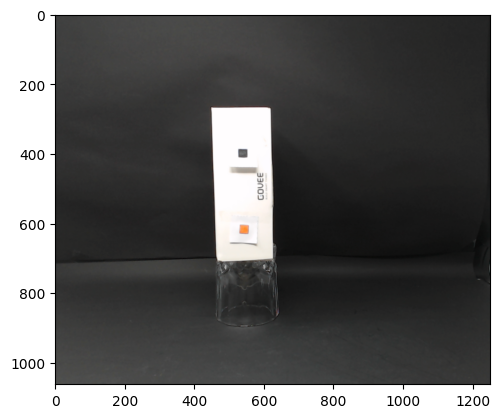

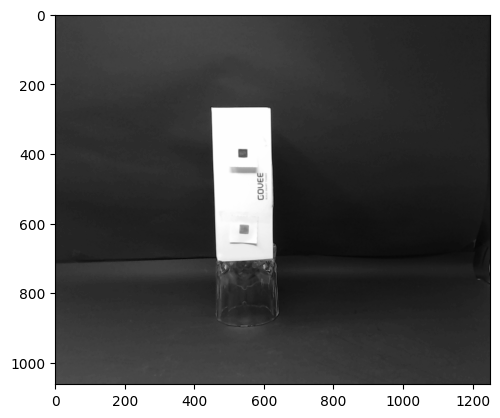

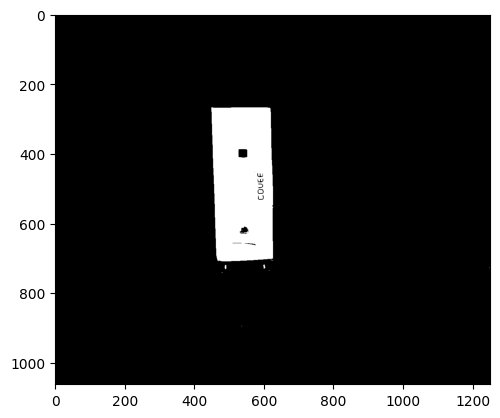

Found 12 Regions
Kantenlänge (Breite): 178 Pixel
Kantenlänge (Höhe): 442 Pixel


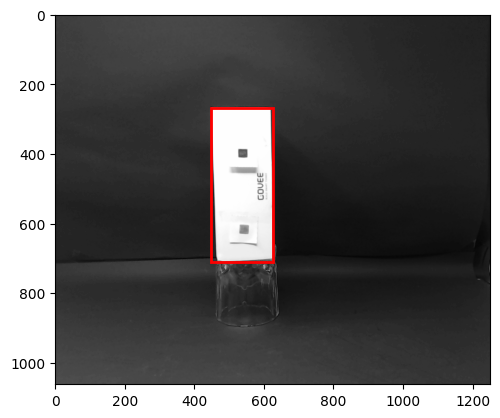

In [17]:

prepared_image_gray, prepared_image_rgb = prepareImage(calibrated_img, margin_right = -410, margin_left = 250, draw=True)
width, height = getEdgeLenght2D(prepared_image_gray, draw_Final=True, draw_Binary=True)

## Orangenes Quadrat finden und ausmessen
Der nächste Schritt ist, das orangene Quadrat zu finden, welches auf dem Paket angebracht worden ist. Da dieses genau den Maße 1cm x 1cm hat, kann die Pixelbreite in Verhältniss zu der Breite und der Höhe der Begrunzungsbox des Paketes gesetzt werden, um die tatsächlichen Maße in Zentimetern zu ermitteln. Um das orangene Quadrat zu finden, wird in der folgenden Methode getOrangeSquareLenght2D() ein Bereich an Orange-RGB-Werten definiert. Anschließend wird das Bild in binäre Werte aufgeteilt, je nach Farbe, ob die Farbe innerhalb des Bereiches der Orange-Werte ist oder nicht. Danach wird alles genau so durchgeführt, wie bei der Vermessung des Paketes, und man erhält wieder die Maße in Pixeln. Dadurch, dass es sich genau um ein Quadrat handelt und so die Seitenverhältnisse vorgeschrieben sind, wird der Durchschnitt der Breite und Höhe ermittelt, dieser wird ausgeben und mit diesem wird in den folgenden Methoden weiter gearbeitet. Bei der Vermessung wird wieder mit der größten Region gearbeitet, da davon ausgegangen werden kann, dass das orangene Quadrat die größte Region an passenden Orangewerten ist. Bei anderen Paketen einer anderen Farbe könnte diese Methode zu Problemen führen, da diese farblich zu nah an dem Quadrat sind.

In [18]:
def getOrangeSquareLenght2D(prepared_image, draw_binary=True, draw_final=True):
    
    plt.imshow(prepared_image)
    plt.show()

    # Definieren des Farbbereiches für Orange im RGB-Farbraum
    lower_orange = np.array([200, 100, 0], dtype=np.uint8)
    upper_orange = np.array([255, 200, 100], dtype=np.uint8)

    # Erstellung eines binären Bildes, welches den orangefarbenen Bereich enthält
    binary_image = cv.inRange(prepared_image, lower_orange, upper_orange)

    if draw_binary:
        plt.imshow(binary_image, cmap='gray')
        plt.show()
    
    largest_region = getLargestRegion2D(binary_image)

    minr, minc, maxr, maxc = largest_region.bbox

    width = maxc - minc
    height = maxr - minr

    len_mean = int(round((width + height) / 2, 0)) 
    
    print(f'Kantenlänge (Mean): {len_mean} Pixel')
    
    if draw_final:
        fig, ax = plt.subplots()
        ax.imshow(prepared_image, cmap='gray')
        rect = plt.Rectangle((minc, minr), len_mean, len_mean, fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)
        plt.show()

    return len_mean

Ausführen der Methode und Ermittlung der Kantenlängen des orangenen Quadrates.

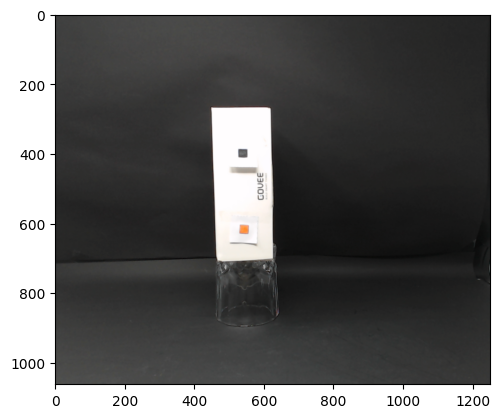

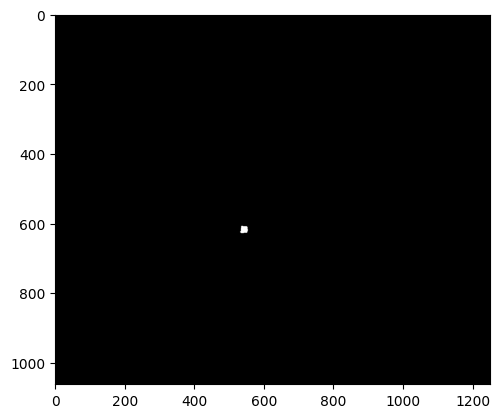

Found 1 Regions
Kantenlänge (Mean): 22 Pixel


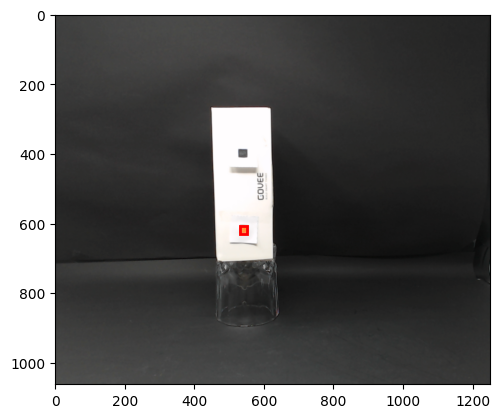

In [19]:
len_1cm_mean = getOrangeSquareLenght2D(prepared_image_rgb)

## Berechnung der Höhe und Breite des Pakets
Mittels der Seitenverhältnisse und der bekannten Maße des Quadrates können diese in Verhältnis mit der Höhe und Breite des Paketes gesetzt werden. Dadurch werden die Maße von diesem in Zentimetern berechnet und ausgegben.

In [20]:
 
width_cm = width / len_1cm_mean
height_cm = height / len_1cm_mean

# Drucken Sie die Ergebnisse
print(f'Kantenlänge (Breite): {width_cm:.2f} cm')
print(f'Kantenlänge (Höhe): {height_cm:.2f} cm')


Kantenlänge (Breite): 8.09 cm
Kantenlänge (Höhe): 20.09 cm


# 3D-Berechnung
Die 2D Vermessung hat relativ gut funktioniert. Es folgt die 3D Vermessung der Pakete mit Breite, Höhe und Tiefe.

## Kamerakalibrierung
Als erster Schritt wird genau wie bei der 2D Vermessung die Kamera kalibriert, sodass die extrinsischen und intrinsischen Parameter, sowie der Fehler ermittelt werden und die Berechnung keine Verzerrung hat.

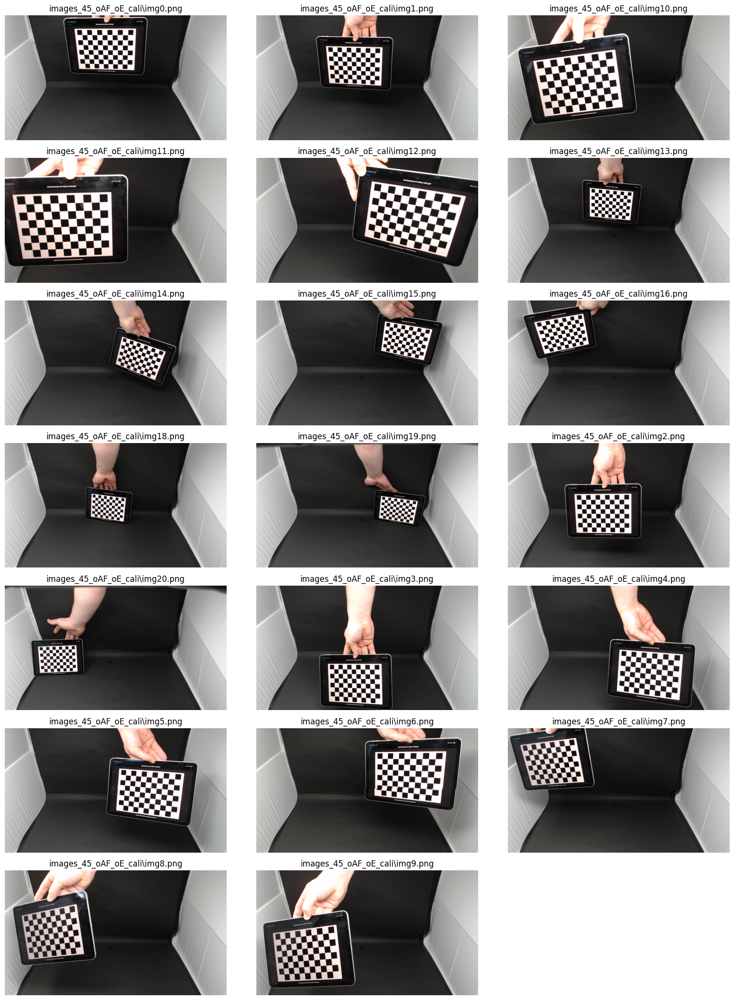

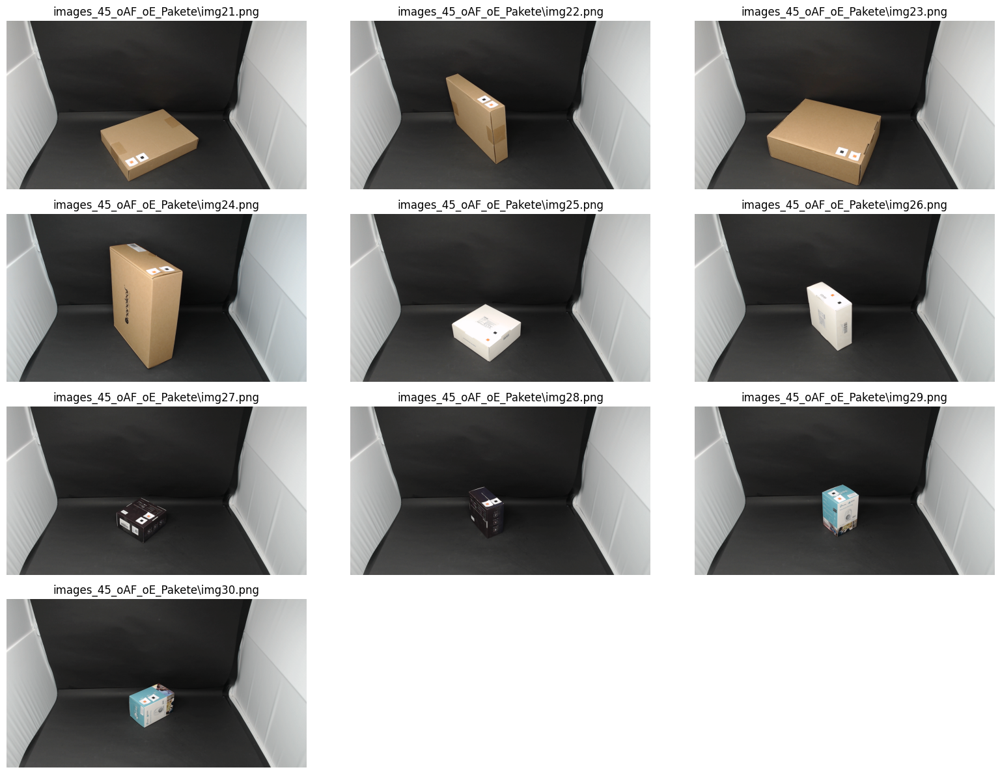

total error: 0.032820304384965006
(1068, 1915, 3)


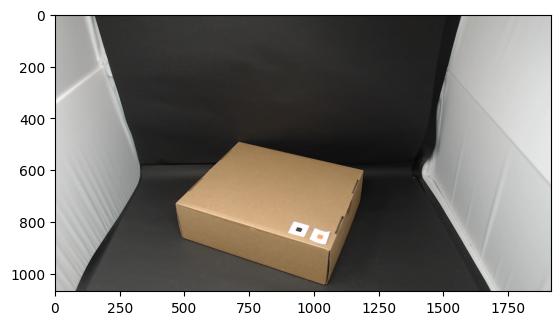

In [21]:
showImagesFromFolder('images_45_oAF_oE_cali')
showImagesFromFolder('images_45_oAF_oE_Pakete')

calibrated_img_3D = calibrate(pathname='images_45_oAF_oE_cali', image_path='images_45_oAF_oE_Pakete/img23.png', draw=False)

print(calibrated_img_3D.shape)
plt.imshow(cv.cvtColor(calibrated_img_3D, cv.COLOR_BGR2RGB))
plt.show()

## Finden und ermitteln der Maße des Paketes
Ähnlich wie bei den 2D Bildern muss zunächst das Paket auf dem Bild gefunden werden. Anschließend können die Seitenverhältnis in Pixeln ermittelt werden.

### Finden aller Eckpunkte des Paketes
Um das Paket dreidimensional berechnen zu können, müssen erst einmal alle Eckpunkte gefunden werden. Dies macht die Methode findEdges3D().

In [22]:
def findEdges3D(gray_image, draw=True):
    edges = cv.Canny(gray_image, 50, 150)

    if draw:
        plt.imshow(edges)
        plt.show()

    return edges

### Finden der größten Kontur
Die Methode findLargestContour3D ermittelt anhand der zuvor ermittelten Eckpunkte die größte Kontur. Bei dieser kann ebenfalls wieder davon ausgegangen werden, dass diese das Paket darstellt, da es auf den Bilder wenig Auswirkungen von anderen Objekten, Licht oder Ähnlichem gibt. Die größte Kontur wird anschließend übergeben.

In [23]:
def findLargestContour3D(edges):
    contours, _ = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    
    contours = sorted(contours, key=cv.contourArea, reverse=True)
    
    return contours[0]

### Approximation der Kontur
Bei dieser Methode wird die größte Kontur vereinfacht. Dies bedeutet, dass versucht wird, die geometrische Form der Kontur nicht zu beeinflussen, aber die Kontur mit so wenig Eckpunkten wie möglich darzustellen. Dies hat das Ergebnis, dass die Datenmenge vereinfacht wird und so spätere Algorithmen einfacher und schneller damit arbeiten können. 

In [24]:
def approximateContour3D(largest_contour):
    epsilon = 0.01 * cv.arcLength(largest_contour, True)
    approx = cv.approxPolyDP(largest_contour, epsilon, True)

    # Sortieren der approximierten Punkte im Uhrzeigersinn
    center = tuple(np.mean(approx, axis=0)[0])
    approx = sorted(approx, key=lambda point: np.arctan2(point[0][1] - center[1], point[0][0] - center[0]))
    return approx

### Kantenlänge der Konturen ermittelt
Innerhalb dieser Methode werden die zuvor definierten Methoden aufgerufen. Dabei werden zunächst alle Eckpunkte ermittelt, mit denen wird die größte Kontur bestimmt, welche wiederum approximiert wird. Innerhalb dieser Kontur werden anschließend alle einzelnen Kanten bestimmt und farbig auf dem Originalbild ausgegeben. Die Länge dieser Kanten wird in Pixeln ermittelt und ausgegeben, dabei werden je zwei gegenüberliegenden Kanten zusammengefasst und der Durchschnitt berechnet, um den tatsächlichen Fehler zu minimieren und der dreidimensionalen Verzerrung entgegen zu wirken. Die Höhe, Breite und Tiefe werden daraufhin in Pixeln ausgegeben.

In [25]:
def getEdgeLenght3D(prepared_Image_Gray, prepared_Image_RGB, draw=True):
    edges = findEdges3D(prepared_Image_Gray, draw=draw)
    largest_contour = findLargestContour3D(edges)

    approx = approximateContour3D(largest_contour)

    colors = [np.array([0, 0, 255]), np.array([0, 255, 0]), np.array([255, 0, 0]),
              np.array([255, 255, 0]), np.array([0, 255, 255]), np.array([255, 0, 255])]
    
    lenghts = dict()

    if draw:
        plt.figure(figsize=(10, 10))
        plt.imshow(cv.cvtColor(prepared_Image_RGB, cv.COLOR_BGR2RGB))

        for i in range(len(approx)):
            start_point = approx[i][0]
            end_point = approx[(i + 1) % len(approx)][0]
            color = colors[i]

            # Berechnung der Länge jeder Kante
            length_pixels = int(np.sqrt((end_point[0] - start_point[0])**2 + (end_point[1] - start_point[1])**2))
            print(f"Kante {i + 1}: Länge = {length_pixels} Pixel, Farbe = {color}")
            lenghts[i] = length_pixels

            # Linien auf das Bild zeichnen
            plt.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linewidth=2, color=color/255)

        plt.title('Image with Smoothed Lines')
        plt.axis('off')
        plt.show()
    
    height_mean = int(round((lenghts[2] + lenghts[5]) / 2, 0))
    length_mean = int(round((lenghts[1] + lenghts[4]) / 2, 0))
    depth_mean = int(round((lenghts[0] + lenghts[3]) / 2, 0))

    return height_mean, length_mean, depth_mean

Aufrufen der Methode und bestimmen der Maße des Paketes in Pixeln.

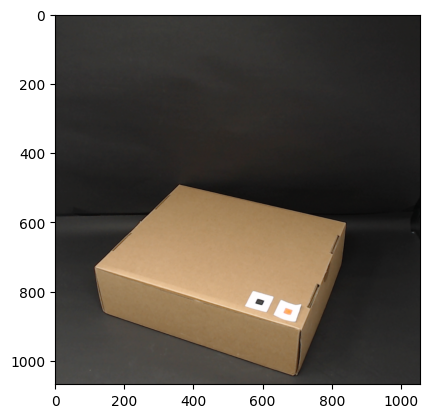

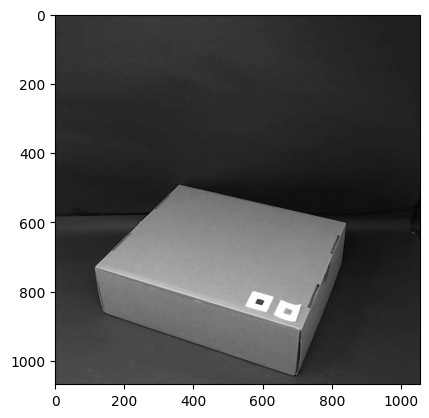

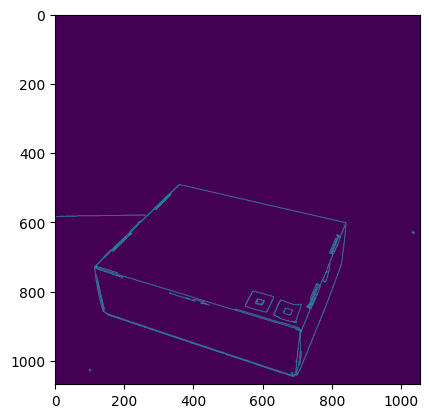

Kante 1: Länge = 339 Pixel, Farbe = [  0   0 255]
Kante 2: Länge = 493 Pixel, Farbe = [  0 255   0]
Kante 3: Länge = 121 Pixel, Farbe = [255   0   0]
Kante 4: Länge = 343 Pixel, Farbe = [255 255   0]
Kante 5: Länge = 579 Pixel, Farbe = [  0 255 255]
Kante 6: Länge = 137 Pixel, Farbe = [255   0 255]


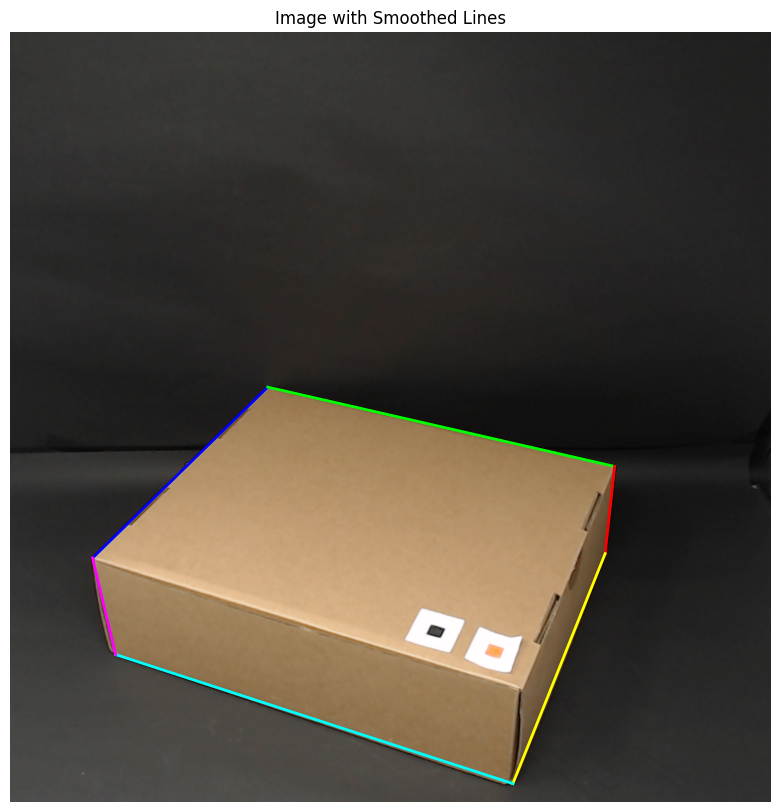

Height: 129 Pixel
Lenght: 536 Pixel
Depth: 341 Pixel


In [26]:
prepared_image_gray_3D, prepared_image_rgb_3D = prepareImage(calibrated_img_3D, margin_left=350, margin_right=-510, draw=True)

prepared_image_gray_3D_Edge = cv.cvtColor(prepared_image_rgb_3D, cv.COLOR_BGR2GRAY)

prepared_image_rgb_3D_Edge = cv.cvtColor(prepared_image_rgb_3D, cv.COLOR_BGR2RGB)

height_mean, length_mean, depth_mean = getEdgeLenght3D(prepared_image_gray_3D_Edge, prepared_image_rgb_3D_Edge)

print(f'Height: {height_mean} Pixel')
print(f'Lenght: {length_mean} Pixel')
print(f'Depth: {depth_mean} Pixel')

## Orangendes Quadrat finden und Maße bestimmen
Der Ansatz ähnelt dem Prozess der 3D-Paketvermessung, bei dem zunächst alle Werte herausgefiltert werden, die nicht im orangen Farbbereich liegen. Die Methode gibt einen Wert zurück, der dem Durchschnitt der ermittelten Höhe und Breite des Quadrats entspricht.

In [27]:
def getOrangeSquareLenght3D(prepared_image):
    hsv_image = cv.cvtColor(prepared_image, cv.COLOR_RGB2HSV)

    # Oranger Farbbereich in HSV
    lower_orange = np.array([5, 100, 100])
    upper_orange = np.array([15, 255, 255])

    mask = cv.inRange(hsv_image, lower_orange, upper_orange)

    plt.imshow(mask)
    plt.show()

    contours, _ = cv.findContours(mask, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

    largest_contour = max(contours, key=cv.contourArea)

    cv.drawContours(prepared_image, [largest_contour], -1, (0, 255, 0), 3)

    x, y, w, h = cv.boundingRect(largest_contour)

    cv.rectangle(prepared_image, (x, y), (x+w, y+h), (255, 0, 0), 2)

    plt.imshow(prepared_image)
    plt.title('Orange Square')
    plt.show()

    return int(round((w+h) / 2, 0))

## Verhältnis und tatsächliche Maße des Paketes bestimmen
Am Ende werden die Maße des orangenen Quadrates mit den Kantenlängen des Paketes verglichen. So kann, wie auch schon bei der 2D Vermessung, die tatsächlichen Maße des Paketes in Zentimetern ermittelt werden, diese wird anschließend ausgegeben.

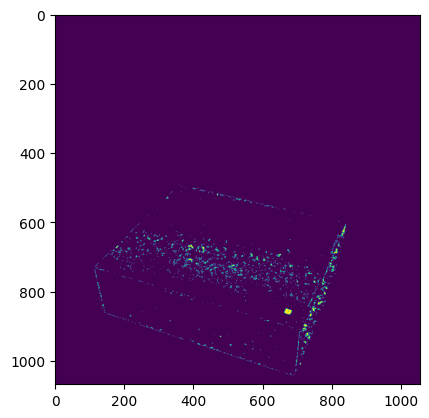

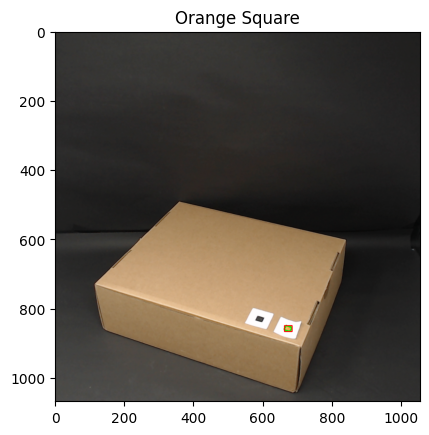

Orange Square in Pixels: 20
Kantenlänge (Länge): 26.80 cm
Kantenlänge (Höhe): 6.45 cm
Kantenlänge (Tiefe): 17.05 cm


In [28]:
len_1cm_mean_3D = getOrangeSquareLenght3D(prepared_image_rgb_3D)

print(f'Orange Square in Pixels: {len_1cm_mean_3D}')

lenght_cm_3D = length_mean / len_1cm_mean_3D
height_cm_3D = height_mean / len_1cm_mean_3D
depth_cm_3D = depth_mean / len_1cm_mean_3D

# Drucken Sie die Ergebnisse
print(f'Kantenlänge (Länge): {lenght_cm_3D:.2f} cm')
print(f'Kantenlänge (Höhe): {height_cm_3D:.2f} cm')
print(f'Kantenlänge (Tiefe): {depth_cm_3D:.2f} cm')



# Fazit
Die dreidimensionale Vermessung des Paketes hat tendenziell funktioniert, allerdings sind die tatsächlichen Werte bei der 3D Vermessung schon weit von den tatsächlichen Werten weg. <br>
Tatsächlichen Werte: Länge: 28cm, Höhe: 7,5cm, Tiefe: 22cm.

Bei der 2D Vermessung hat die gewählte Methode sich bewährt, da sich alles in einer Ebene befindet und so keine Tiefenverzerrung Einfluss auf die Vermessung nimmt. Bei den 3D Bildern kam es dadruch zu Problemen, sodass die Werte im Endeffekt relativ weit von den tatsächlichen entfernt sind. Dies sieht man bereits auf den ausgebenenen Bildern, bei denen das Quadrat nur ganz ungefähr erkannt worden ist und sich die Kantenlängen weiter hinten auf dem Bild auch verzerren. Der Ansatz müsste dabei noch einmal überdacht werden, aber das Ausprobieren weiterer Methoden würde den Rahmen des Projektes und dieser Studienarbeit sprengen. <br>
Der aktuelle Code der Vermessung funktoniert allerdings auch nicht auf alle gemachten Bilder von Paketen, da teilweise Pakete Sticker oder Ähnliches haben, welche die Kantenerkennung schwierig machen, da sie teilweise als eigenständige Pakete ermittelt werden.

Allgemein sind wir ziemlich zufrieden, da wir in der 2D Vermessung ziemlich genaue Werte und in der 3D Vermessung auch einigermaßen passende Werte ermitteln konnten. Die Kalibrierung der Kamera hat dabei sehr gut funktioniert, sodass wir problemlos mit den Bildern arbeiten konnten. Allerdings war die gewählte Kamera von der Qualität bereits sehr gut, wodurch wir wenig Einflüsse wie Rauschen oder Ähnliches und auch einen geringen Fehler hatten.